In [19]:
# import pandas as pd
# from pandas_profiling import ProfileReport
# from pandasql import sqldf
# pysqldf = lambda q: sqldf(q, globals())
# pd.set_option('display.max_rows', None)
# import seaborn as sns
# import matplotlib.pyplot as plt

import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from wordcloud import WordCloud


import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize
from textblob import TextBlob, Word, Blobber

# from sklearn.feature_extraction.text import TfidfVectorizer
# from sklearn.naive_bayes import MultinomialNB
# from sklearn.svm import LinearSVC
# from sklearn.linear_model import LogisticRegression
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import f1_score, confusion_matrix
# from sklearn.metrics import classification_report

import warnings
warnings.filterwarnings("ignore")
import pandas as pd
from pandas_profiling import ProfileReport
from pandasql import sqldf
pysqldf = lambda q: sqldf(q, globals())
pd.set_option('display.max_rows', None)
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
from sklearn.feature_extraction.text import CountVectorizer
from plotly.offline import iplot
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [20]:
df = pd.read_csv("D:/Git/bert-sentiment/input/data/trainO.csv")

In [21]:
# profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)
# profile.to_notebook_iframe()
df.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [22]:
# List all columms
df.columns

Index(['id', 'title', 'author', 'text', 'label'], dtype='object')

### Check null value's count

In [23]:
df.isnull().sum()

id           0
title      558
author    1957
text        39
label        0
dtype: int64

### Delete null values

In [24]:
# deleted the records which has null value. totoal 2.5% records
df.dropna(inplace=True)
df.label.count()

18285

#### <font color=green> ANALYSIS:- This column is 100% unique and since we don’t want to overfit the model, hence we are removing id column.  </font>
 

In [25]:
del df['id']

### Create new feature for number of words in the string and length of the string

In [26]:
df['text_len'] = df['text'].astype(str).apply(len)
df['word_count'] = df['text'].apply(lambda x: len(str(x).split()))


In [27]:
df['title_len'] = df['title'].astype(str).apply(len)
df['title_word_count'] = df['title'].apply(lambda x: len(str(x).split()))


### Create the two dataframes for the analysis

In [28]:
fakenews = df[df["label"] == 1]
realnews = df[df["label"] == 0]

## Univariate Analysis

### The distribution of text length

In [29]:
# Distrubution of text length 
df['text_len'].iplot(
    kind='hist',
    bins=100,
    xTitle='text length',
    linecolor='black',
    yTitle='count',
    title='Text Length Distribution of "text" feature')

#### <font color=green> ANALYSIS:- This column has more than 72% data which length of text is greater than 2k  </font>
 

### The distribution of word count

In [214]:
# Distrubution of word count 
df['word_count'].iplot(
    kind='hist',
    bins=100,
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    title='Word Count Distribution of "text" feature')

#### <font color=green> ANALYSIS:- This column has more than 65% records which word count is less than 900  </font>
 

In [226]:
# # # categorized data on sentence size 
# q=  "select count(word_count) from df  group by label"
# joined = pysqldf(q)
# joined.head()

In [63]:
df.groupby('label').count()['text_len'].iplot(kind='bar', yTitle='Count', linecolor='black', opacity=0.8,
                                                           title='Bar chart of label and textlen', xTitle='label')

#### <font color=green> ANALYSIS:- 56% has 0s and 44% has 1s that has almost balanced word count   </font>

## Calculate Unigram, Bigram & Trigram of fake and real news and analyze

In [227]:
# Function to calcualte unigram, bigram and trigram
def get_top_n_gram_words(corpus, n=None,gram=1):
    vec = CountVectorizer(ngram_range=(gram, gram)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

#### The distribution of top unigrams before removing stop words of fake news

In [92]:
# fakenews unigram : 
common_words = get_top_n_gram_words(fakenews['text'], 20)
# for word, freq in common_words:
#     print(word, freq)
df1 = pd.DataFrame(common_words, columns = ['commonTextUnigram' , 'count'])
df1.groupby('commonTextUnigram').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in text before removing stop words')

#### The distribution of top bigrams before removing stop words of fake news

In [93]:
# fakenews bigram
common_words = get_top_n_gram_words(fakenews['text'], 20,2)
# for word, freq in common_words:
#     print(word, freq)
df2 = pd.DataFrame(common_words, columns = ['commonTextbigram' , 'count'])
df2.groupby('commonTextbigram').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 bigrams in text before removing stop words')

#### The distribution of top trigrams before removing stop words of fake news

In [94]:
# fakenews Trigram
common_words = get_top_n_gram_words(fakenews['text'], 20,3)
# for word, freq in common_words:
#     print(word, freq)
df3 = pd.DataFrame(common_words, columns = ['commonTextTrigram' , 'count'])
df3.groupby('commonTextTrigram').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 trigrams in text before removing stop words')

#### The distribution of top unigrams before removing stop words of real news

In [95]:
# realnews unigram
common_words = get_top_n_gram_words(realnews['text'], 20)
# for word, freq in common_words:
#     print(word, freq)
df4 = pd.DataFrame(common_words, columns = ['commonTextUnigram' , 'count'])
df4.groupby('commonTextUnigram').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in text before removing stop words')

#### The distribution of top bigrams before removing stop words of real news

#### The distribution of top trigrams before removing stop words of real news

In [97]:
# realnews trigram
common_words = get_top_n_gram_words(realnews['text'], 20,3)
# for word, freq in common_words:
#     print(word, freq)
df6 = pd.DataFrame(common_words, columns = ['commonTextUnigram' , 'count'])
df6.groupby('commonTextUnigram').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in text before removing stop words')

#### As is the case when working with any kind of text, the first step is separating each article’s body text into tokens to get a corpus. Using the corpus, I can get features from the words. To tokenize each article, I used the NLTK package to do the following: <br> 1) Imported English words <br>2) Separated each article into tokens (removes whitespaces) <br>3) All words lowercased <br> 4) Removed punctuation and stop words <br> 5)   Lemmatized (converted to root form) words 

In [31]:
# After removing stopwords 
import string
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = list(stopwords.words('english'))
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()  

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\sichake\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\sichake\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sichake\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [40]:
def processText(df):
    by_article_list=[]
    for article in (df["text"]):
        words = word_tokenize(article)
        words = [word.lower() for word in words if word.isalpha()] #lowercase
        words = [word for word in words if word not in string.punctuation and word not in stop_words] #punctuation, stopwords
        words = [lemmatizer.lemmatize(word) for word in words] #convert word to root form
        by_article_list.append(' '.join(words))
    return by_article_list

def processTitle(df):
    by_article_list=[]
    for article in (df["title"]):
        words = word_tokenize(article)
        words = [word.lower() for word in words if word.isalpha()] #lowercase
        words = [word for word in words if word not in string.punctuation and word not in stop_words] #punctuation, stopwords
        words = [lemmatizer.lemmatize(word) for word in words] #convert word to root form
        by_article_list.append(' '.join(words))
    return by_article_list

#### Process fakenews and realnews dataset and extract clean text 

In [34]:

fakenews['clean_text'] =processText(fakenews)

In [237]:
realnews['clean_text'] =processText(realnews)

#### Process text from main dataframe and create the new feature for it

In [35]:
df['clean_text'] =processText(df)

In [41]:
df['clean_title'] =processTitle(df)

In [42]:
df['clean_text_len'] = df['clean_text'].astype(str).apply(len)
df['clean_text_word_count'] = df['clean_text'].apply(lambda x: len(str(x).split()))
df['clean_text_title_len'] = df['clean_title'].astype(str).apply(len)
df['clean_text_title_word_count'] = df['clean_title'].apply(lambda x: len(str(x).split()))

#### The distribution of top unigrams after cleanign the text [removing stop words,punctuation] of fake news

In [120]:
# fakenews unigram
common_words = get_top_n_gram_words(fakenews['clean_text'], 20)
# for word, freq in common_words:
#     print(word, freq)
df7 = pd.DataFrame(common_words, columns = ['commonTextUnigram' , 'count'])
df7.groupby('commonTextUnigram').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in text before removing stop words')

#### The distribution of top bigrams after cleanign the text [removing stop words,punctuation] of fake news

#### The distribution of top trigrams after cleanign the text [removing stop words,punctuation] of fake news

In [127]:
# fakenews triigram
common_words = get_top_n_gram_words(fakenews['clean_text'], 20,3)
# for word, freq in common_words:
#     print(word, freq)
df7 = pd.DataFrame(common_words, columns = ['commonTextUnigram' , 'count'])
df7.groupby('commonTextUnigram').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in text before removing stop words')

#### The distribution of top unigrams after cleanign the text [removing stop words,punctuation] of real news


In [123]:
# realnews unigram
common_words = get_top_n_gram_words(realnews['clean_text'], 20)
# for word, freq in common_words:
#     print(word, freq)
df7 = pd.DataFrame(common_words, columns = ['commonTextUnigram' , 'count'])
df7.groupby('commonTextUnigram').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in text before removing stop words')

#### The distribution of top bigrams after cleanign the text [removing stop words,punctuation] of real news

In [124]:
# realnews bigram
common_words = get_top_n_gram_words(realnews['clean_text'], 20,2)
# for word, freq in common_words:
#     print(word, freq)
df8 = pd.DataFrame(common_words, columns = ['commonTextUnigram' , 'count'])
df8.groupby('commonTextUnigram').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in text before removing stop words')

#### The distribution of top trigrams after cleanign the text [removing stop words,punctuation] of real news

In [125]:
# realnews trigram
common_words = get_top_n_gram_words(realnews['clean_text'], 20,3)
# for word, freq in common_words:
#     print(word, freq)
df9 = pd.DataFrame(common_words, columns = ['commonTextUnigram' , 'count'])
df9.groupby('commonTextUnigram').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in text before removing stop words')

#### <font color=green> ANALYSIS:- After analyzing these n-grams, I ended up not using them in the modeling process because <br>1) processing time was multiplied through the use of n-grams on top of single tokens  <br>2) n-grams were pretty similar between the two classes of text and  <br>3) metrics from the results of modeling (see below) were already strong without adding n-grams. </font>
 

#### Part-Of-Speech Tagging (POS) is a process of assigning parts of speech to each word, such as noun, verb, adjective, etc. <br>We use a simple TextBlob API to dive into POS of our “Text” feature in our data set, and visualize these tags.

#### The distribution of top part-of-speech tags of text corpus of fake news

In [239]:
# The distribution of top part-of-speech tags of text corpus
blob = TextBlob(str(fakenews['text']))
pos_df = pd.DataFrame(blob.tags, columns = ['word' , 'pos'])
pos_df = pos_df.pos.value_counts()[:20]
pos_df.iplot(
    kind='bar',
    xTitle='POS',
    yTitle='count', 
    title='Top 20 Part-of-speech tagging for text corpus')

#### The distribution of top part-of-speech tags of text corpus of real news

In [36]:
# The distribution of top part-of-speech tags of text corpus
blob = TextBlob(str(realnews['text']))
pos_df = pd.DataFrame(blob.tags, columns = ['word' , 'pos'])
pos_df = pos_df.pos.value_counts()[:20]
pos_df.iplot(
    kind='bar',
    xTitle='POS',
    yTitle='count', 
    title='Top 20 Part-of-speech tagging for text corpus')

#### <font color=green> ANALYSIS:- fakenews and realnews dataframe has almost same count of POS </font>

#### Box plot is used to compare the text length of each text and label .

In [244]:
from plotly.offline import iplot
y0 = df.loc[df['label'] == 1]['text_len']
y1 = df.loc[df['label'] == 0]['text_len']


trace0 = go.Box(
    y=y0,
    name = 'fake',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'real',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "Text length Boxplot of label Name"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "text Length Boxplot of label Name")

#### Box plot is used to compare the word count of each text and label .

In [37]:
from plotly.offline import iplot
y0 = df.loc[df['label'] == 1]['word_count']
y1 = df.loc[df['label'] == 0]['word_count']


trace0 = go.Box(
    y=y0,
    name = 'fake',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'real',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "word count Boxplot of label Name"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "word count Boxplot of label Name")

#### <font color=green> ANALYSIS:- Text Word Count:- for realnews  min:1 , q1:400, Median:713, q3: 1179  <br> for fakenews  min:0 , q1:200, Median:433, q3: 875  <br> 1) Real news has the aveagage word count  is 713 and fakenews is 433 so by looking at the word count size also we can determine whether news is fake or real <br>2) there are more outlier in the fake news <br> for most of the news, fake news text length is little bit lower than the real news </font>

In [ ]:
# df['clean_text_len'] = df['clean_text'].astype(str).apply(len)
# df['clean_text_word_count'] = df['clean_text'].apply(lambda x: len(str(x).split()))
# df['clean_text_title_len'] = df['clean_title'].astype(str).apply(len)
# df['clean_text_title_word_count'] = df['clean_title'].apply(lambda x: len(str(x).split()))

In [43]:
from plotly.offline import iplot
y0 = df.loc[df['label'] == 1]['clean_text_word_count']
y1 = df.loc[df['label'] == 0]['clean_text_word_count']


trace0 = go.Box(
    y=y0,
    name = 'fake',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'real',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "word count Boxplot of label Name"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "word count Boxplot of label Name")

#### Box plot is used to compare the text length of each title and label .

In [284]:
from plotly.offline import iplot
y0 = df.loc[df['label'] == 1]['title_len']
y1 = df.loc[df['label'] == 0]['title_len']


trace0 = go.Box(
    y=y0,
    name = 'fake',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'real',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "Title length Boxplot of label Name"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Title Length Boxplot of label Name")

#### Box plot is used to compare the word count of each title and label .

In [286]:
from plotly.offline import iplot
y0 = df.loc[df['label'] == 1]['title_word_count']
y1 = df.loc[df['label'] == 0]['title_word_count']


trace0 = go.Box(
    y=y0,
    name = 'fake',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'real',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "Title word Count Boxplot of label Name"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Title Word Count Boxplot of label Name")

#### <font color=green> ANALYSIS:- Titile Text Length: for realnews  min:22 , q1:70, Median:81, q3: 89  <br> for fakenews  min:3 , q1:50, Median:67, q3: 83  <br> 1) Real news always has more than 22 words however in fake news may have less  <br>2) there are more outlier in the fake news<br>Titile Word Count: for realnews  min:4 , q1:12, Median:84, q3: 16  <br>3) for fakenews  min:1 , q1:8, Median:10.5, q3: 13 :fake news has less word compare to real news</font>

#### function for extract the words for wordcloud .

In [259]:
def extractWords(df):
    text_words = '' 
    for val in df.clean_text: 
        # typecaste each val to string 
        val = str(val) 
        # split the value 
        tokens = val.split() 
        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 
        text_words += " ".join(tokens)+" "
    return text_words

#### wordcloud for fake news

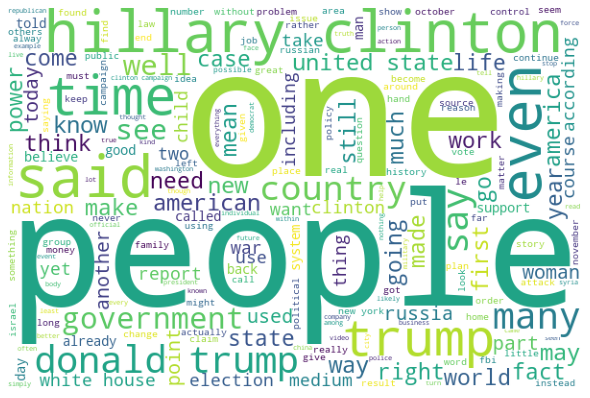

In [261]:
# worldcloud
text_words = extractWords(fakenews)
plt.subplots(figsize = (8,8))

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 600,
                    height = 400
                        ).generate(text_words)
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.tight_layout(pad=0)
plt.show()

#### wordcloud for real news

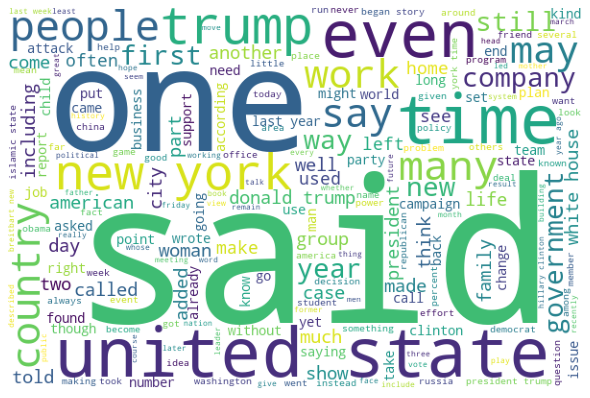

In [262]:
# worldcloud
text_words = extractWords(realnews)
plt.subplots(figsize = (8,8))

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 600,
                    height = 400
                        ).generate(text_words)
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.tight_layout(pad=0)
plt.show()

#### <font color=green> ANALYSIS:- by looking at the graph it looks fake and real news has same words </font>

#### Lets dig into word count and understand more 

In [167]:
# find out number of words in title 
df['temp'] = df['text'].apply(lambda x: len(str(x).split(" ")))
df[['temp','text']].head()


,temp,text
0,820,House Dem Aide: We Didn’t Even See Comey’s Let...
1,727,Ever get the feeling your life circles the rou...
2,1266,"Why the Truth Might Get You Fired October 29, ..."
3,559,Videos 15 Civilians Killed In Single US Airstr...
4,154,Print \nAn Iranian woman has been sentenced to...


In [6]:
# find out the records which has only one words
q= "select count(temp) from df where  temp ==1 and text is not null"
joined = pysqldf(q)
joined

PandaSQLException: (sqlite3.OperationalError) no such table: df
[SQL: select count(temp) from df where  temp ==1 and text is not null]
(Background on this error at: http://sqlalche.me/e/e3q8)

In [3]:
# find out the records which has more than 10 words
q= "select count(temp) from df where  temp <10 and text is not null"
joined = pysqldf(q)
joined

NameError: name 'pysqldf' is not defined

In [2]:
# records which has duplicate values
q= "select sum(cnt) - count(cnt) from (select count(label) as cnt from df where text is not null group by text having count(label)>1 ) "
joined = pysqldf(q)
joined

NameError: name 'pysqldf' is not defined

#### Lets compare word count of fake news and real news 

In [1]:
# words and lable comparision

plt.figure(figsize=(16, 6))
sns.set(style="darkgrid")
ax = sns.countplot(x="cnt", hue="label", data=joined, order = joined['label'].value_counts().index)
        

NameError: name 'plt' is not defined

#### <font color=green> ANALYSIS:- By looking at the graph it looks <br> 1) if there are less than 10 words in the sentence then it is most probably fakenews </font>

#### Lets dig into text length and understand more 

In [269]:
# categorized data on sentence size 
q=  "select label, case when length(text) <= 1000 then '<=1000' when length(text) > 1000 and length(text) <=  2000 then  '1k-2k' when length(text) > 2000 and length(text) <=  3000 then  '2k-3k ' when length(text) > 3000 and length(text) <=  4000 then  '3k-4k ' when length(text) > 4000 and length(text) <=  5000 then  '4k-5k' when length(text) > 5000 and length(text) <=  6000 then  '5k-6k' when length(text) > 6000 and length(text) <=  7000 then  '6k-7k' when length(text) > 7000 and length(text) <=  8000 then  '7k-8k' when length(text) > 8000 and length(text) <=  9000 then  '8k-9k' when length(text) > 9000 and length(text) <=  10000 then  '9k-10k ' when length(text) > 10000 and length(text) <= 11000 then '10k-11k' when length(text) > 11000 and length(text) <= 12000 then '11k-12k' when length(text) > 12000 and length(text) <= 13000 then '12k-13k' when length(text) > 13000 and length(text) <= 14000 then '13k-14k' when length(text) > 14000 and length(text) <= 15000 then '14k-15k' when length(text) > 15000 and length(text) <= 16000 then '15k-16k'  else '>16k' end as cnt from df where text is not null"
joined = pysqldf(q)
joined.head()

,label,cnt
0,1,4k-5k
1,0,4k-5k
2,1,7k-8k
3,1,3k-4k
4,1,<=1000


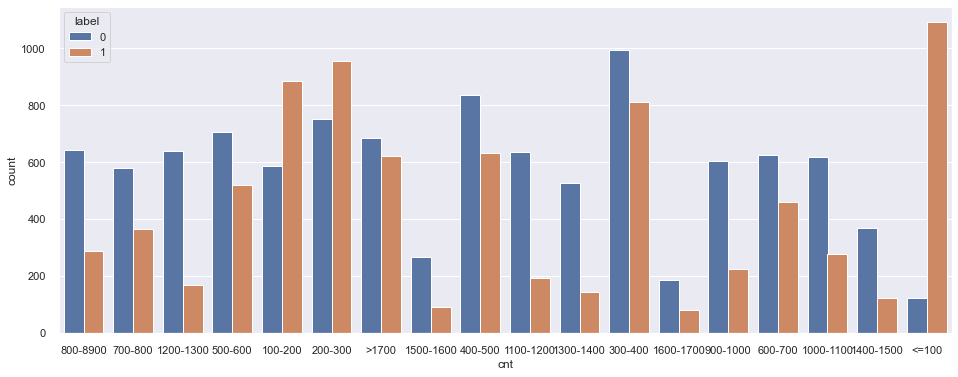

In [276]:
# words and lable comparision
plt.figure(figsize=(16, 6))
sns.set(style="darkgrid")
ax = sns.countplot(x="cnt", hue="label", data=joined)
        

#### Distribution of text length for fake and real news 

In [278]:
x1 = df.loc[df['label'] == 1, 'text_len']
x0 = df.loc[df['label'] == 0, 'text_len']

trace1 = go.Histogram(
    x=x0, name='Fake News',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Real News',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='Distribution of text length of text based on label')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

#### <font color=green> ANALYSIS:- By looking at the graph it looks <br> 1) fake news text length is either small or very big  </font>

#### Analyze how author has contribute for fake/real news  

In [279]:
x1 = df.loc[df['label'] == 1, 'author']
x0 = df.loc[df['label'] == 0, 'author']

trace1 = go.Histogram(
    x=x0, name='Fake News',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Real News',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='Distribution of text length of text based on label')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

#### <font color=green> ANALYSIS:- These people are giving the fake or real news. However, we will not consider author name for the model building becuase it might overfit the model </font>

In [282]:
df.title_len

0         81
1         55
2         33
3         63
4         93
5        124
7         87
9         93
10        96
11        58
12        95
13        49
14        85
15        79
16        58
17        92
18        25
19        69
21        67
22        52
24        88
25        58
26       111
27        72
28        97
29        54
30        70
32        74
33        87
34       100
35        75
36        66
37        39
38        67
39        84
40        62
41        45
42        74
44        82
45        75
46        76
48        85
49       106
50        28
52        90
55        66
56        86
57        40
58        89
59        60
60        75
61        58
62        91
63        57
64        84
65        74
66        87
67        84
68        60
69        77
70        39
71        46
72        61
73        76
74        79
75        76
77        64
78        74
79        84
80        99
81        78
82        26
83        63
84        59
85        81
86         6
87        80

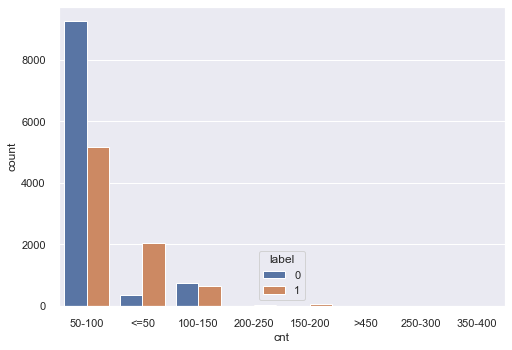

In [290]:
# categorized data on sentence size 
q=  "select label, case when length(title) <= 50 then '<=50' when length(title) > 50 and length(title) <= 100 then '50-100' when length(title) > 100 and length(title) <= 150 then '100-150' when length(title) > 150 and length(title) <= 200 then '150-200' when length(title) > 200 and length(title) <= 250 then '200-250' when length(title) > 250 and length(title) <= 300 then '250-300' when length(title) > 300 and length(title) <= 350 then '300-350' when length(title) > 350 and length(title) <= 400 then '350-400' when length(title) > 400 and length(title) <= 450 then '400-450'  when length(title) > 450  then '>450' else 0 end as cnt from df where title is not null"
joined = pysqldf(q)
# words and lable comparision

sns.set(style="darkgrid")
ax = sns.countplot(x="cnt", hue="label", data=joined)
        

#### <font color=green> ANALYSIS:- By looking at the graph it looks <br> 1) if the sentence size is less than 1kthen it is most probably fakenews </font>

In [273]:

profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)
''profile.to_notebook_iframe()

#### <font color=green> ANALYSIS:- Pandas Report <br> <br>PFB observation for Title field  <br>i.	Total 558 records which are null <br>ii.	 “titile” has 439 records the duplicate values <br>iii.	23 records which has only single word<br>iv.	33.55% records have less than 10 words  <br>v.	label “1” is assigned to the records which have null value<br>vi.	If we use BERT tokenizer then, we dont need to do the below text processing as BERT can handle it <br>    1.	We can check common words and remove those <br>    2.	We can check rare words and remove those <br>    3.	Spelling correction <br>    4.	Stemming <br>    5.	Lemmatization<br>vii.	IF the words is less than 10 words or more than 20 words then its high probability that it will be fake news <br>viii.	If the words between 10 to 20 then its high probability that it is real news  <br>ix.	Sentence size is less than 50 has highly fake news<br>x.	Average sentence size of the fake news is less than the real news <br>xi.	Outlier are exists for fake news <br><br>PFB observation for Text field<br>   1) todo </font>